Scraping Reddit using Praw

https://github.com/parth647/reddit_scraping_using_praw

In [ ]:
#To install praw to scrape web details from reddit
!pip install praw

In [1]:
#Importing relevant packages
import praw
import pandas as pd
from datetime import datetime
import requests as re
import numpy as np
import os
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
# Your reddit details
reddit = praw.Reddit(client_id="2-gxiJHRyoxNsg",      # your client id
                     client_secret="Gj7S8zzWU9BYcQ2k5RpwCKIOBAXLeA",  #your client secret
                     user_agent="scrape reddit", #user agent name
                     username = "Weshi09",     # your reddit username
                     password = "fxk9370midoski")     # your reddit password

In [ ]:
sub = ['Singapore']  # make a list of subreddits you want to scrape the data from

for s in sub:
    subreddit = reddit.subreddit(s)   # Chosing the subreddit

Singapore by Postal District Number

Initializing a dictionary to store the different postal district number as key and the name of its general locations as values

In [ ]:
postal_district_num = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
general_location = [['Raffles Place', 'Cecil', 'Marina', "People\'s Park", "Boat Quay", "Chinatown", "Havelock Road", "Suntec City"],
                    ['Anson', 'Tanjong Pagar', 'Neil Road', "Shenton Way"],
                    ['Bukit Merah', 'Queenstown', 'Tiong Bahru', "Alexandra Road"],
                    ['Telok Blangah', 'Harbourfront', 'Keppel', "Mount Faber", "Sentosa"],
                    ['Buona Vista', 'Dover', 'Pasir Panjang', "West Coast", "Hong Leong Garden", "Clementi"],
                    ['High Street', 'Beach Road', 'City Hall', "North Bridge Road"],
                    ['Middle Road', 'Golden Mile', 'Bencoolen Road', "Bugis", "Rochor"],
                    ['Little India', 'Farrer Park', 'Jalan Besar', "Lavender"],
                    ['Orchard', 'Cairnhill', 'River Valley', "Killiney", "Leonie Hill", "Oxley"],
                    ['Ardmore', 'Bukit Timah', "Balmoral", "Boat Quay", "Grange Road", "Holland", "Tanglin"],
                    ['Watten Estate', 'Thomson', "Chancery", "Bukit Timah", "Dunearn Road", "Newton"],
                    ['Balestier', 'Moulmein', 'Novena', "Toa Payoh", "Serangoon"],
                    ['Macpherson', 'Braddell', 'Potong Pasir', "Bidadari"], 
                    ['Geylang', 'Eunos', 'Kembangan', "Paya Lebar", "Aljunied"], 
                    ['Katong', 'Joo Chiat', 'Amber Road', "Marine Parade", "Siglap", "Tanjong Rhu"],
                    ['Bedok', 'Upper East Coast', 'Eastwood', "Kew Drive", "Bayshore", "Chai Chee"], 
                    ['Loyang', 'Changi'],
                    ['Simei', 'Tampines', 'Pasir Ris'],
                    ['Serangoon Garden', 'Hougang', 'Punggol', 'Sengkang'],
                    ['Ang Mo Kio', 'Bishan', 'Braddell Road', "Thomson"],
                    ['Upper Bukit Timah', 'Ulu Pandan', "Hume Avenue"],
                    ['Penjuru', 'Jurong', 'Pioneer', "Tuas", "Boon Lay"],
                    ['Hillview', 'Dairy Farm', 'Bukit Panjang', "Choa Chu Kang", "Bukit Batok"], 
                    ['Lim Chu Kang', 'Tengah', 'Kranji', "Sungei Gedong"], 
                    ['Woodgrove', 'Woodlands', 'Admiralty','Kranji'],
                    ['Upper Thomson', 'Springleaf', 'Tagore', "Yio Chu Kang"],
                    ['Yishun', 'Sembawang', 'Senoko'],
                    ['Seletar']]

postal_district = {postal_district_num[i]: general_location[i] for i in range(len(postal_district_num))}                       

In [ ]:
#To convert the time format Date-Month-Year
def format_time(x):
  reformat_time = datetime.fromtimestamp(int(x)).strftime("%d-%m-%Y, %I:%M%p")
  day_month_year = reformat_time.split(",")[0]
  year = int(day_month_year.split("-")[2])
  return day_month_year, year

In [ ]:
# Creating dictionary to store the data, which will be converted into a dataframe

query = ["Seletar"]
num = 28
for item in query:
    post_dict = {
        "district_num" : num,
        "title" : [],
        "score" : [],
        "id" : [],
        "url" : [],
        "comms_num": [],
        "created" : [],
        "body" : []
    }
    comments_dict = {
        "district_num" : num,
        "comment_id" : [],
        "comment_parent_id" : [],
        "comment_body" : [],
        "comment_link_id" : [],
        "created" : []
    }
    for submission in subreddit.search(query ,sort = "top",limit = None):
      date, year = format_time(submission.created)

      if item.lower() in submission.title.lower() and year >= 2018:               #if item inside post title 
        post_dict["title"].append(submission.title)
        post_dict["score"].append(submission.score)
        post_dict["id"].append(submission.id)
        post_dict["url"].append(submission.url)
        post_dict["comms_num"].append(submission.num_comments)
        post_dict["created"].append(date)
        post_dict["body"].append(submission.selftext)
        
        ##### Acessing comments on the post
        submission.comments.replace_more(limit = 10)
        for comment in submission.comments.list():
            date, year = format_time(comment.created_utc)
            comments_dict["comment_id"].append(comment.id)
            comments_dict["comment_parent_id"].append(comment.parent_id)
            comments_dict["comment_body"].append(comment.body)
            comments_dict["comment_link_id"].append(comment.link_id)
            comments_dict["created"].append(date)
    post_comments = pd.DataFrame(comments_dict)
    path = r'/content/' + str(num) + '/'
    post_comments.to_csv(path + "Comments_"+ item +"_subreddit.csv")
    post_data = pd.DataFrame(post_dict)
    post_data.to_csv(path + item +"_subreddit.csv")

In [ ]:
#Zipping all the comments csv files of each district
!zip -r /content/postal_district.zip /content/postal_district

#Downloaded all the csv files into locally
from google.colab import files
files.download("/content/postal_district.zip")

Data Cleaning

In [ ]:
#Retrive and saving the directory of each csv files into a list_directory folder, which will be used to combined all the csv files
import os
rootdir = '/content/drive/MyDrive/BT4222 WEISHENG/Comments by district'
list_directory = []
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
      list_directory.append(str(os.path.join(subdir, file)))
      print(os.path.join(subdir, file))

In [ ]:
#Combine all the comments csv file into 1 dataframe
%%time
new_df_cols = ['district_num', 'comment_id', 'comment_parent_id', 'comment_body', 'comment_link_id', 'created']
all_comments_relevant = pd.DataFrame(columns=new_df_cols)

for csv in list_directory :
    temp_df = pd.read_csv(csv)
    temp_df = temp_df.drop('Unnamed: 0', 1)
    all_comments_relevant = all_comments_relevant.append(temp_df, ignore_index=True)
  # start = '/content/drive/MyDrive/BT4222 WEISHENG/Comments by district/comments_'
  # end = '/Comments_'
  # district = int(csv[csv.find(start)+len(start):csv.rfind(end)])
  # temp_df['district_num'] = district

CPU times: user 1.88 s, sys: 39.4 ms, total: 1.92 s
Wall time: 2.09 s


In [ ]:
all_comments_relevant.to_csv("all_comments_relevant_unfiltered_reddit.csv")

In [6]:
all_comments_relevant = pd.read_csv('/content/drive/MyDrive/BT4222 WEISHENG/Generated csv/reddit/all_comments_relevant_unfiltered_reddit.csv')

In [7]:
all_comments_relevant.shape

(86087, 7)

Handling of missing data


In [8]:
all_comments_relevant.isnull().values.any()

False

Handling of duplicated data and noisy data

In [9]:
#Remove duplicate comments
all_comments_relevant.drop(all_comments_relevant[all_comments_relevant['comment_id'].duplicated()].index, inplace = True)

#Remove deleted comments
all_comments_relevant.drop(all_comments_relevant[all_comments_relevant['comment_body']=='[deleted]'].index, inplace = True)
all_comments_relevant.drop(all_comments_relevant[all_comments_relevant['comment_body']=='[removed]'].index, inplace = True)

#Remove moderator bot comments
all_comments_relevant.drop(all_comments_relevant[all_comments_relevant['comment_link_id'] == 'AutoModerator'].index, inplace = True)

In [10]:
all_comments_relevant.shape

(75340, 7)

In [ ]:
all_comments_relevant.groupby('district_num')['comment_id'].nunique().sort_values(ascending=False)

district_num
19    7978
22    6404
20    5159
18    5086
17    5040
1     4910
27    4164
3     3528
4     3415
25    3256
23    2997
9     2901
2     2842
14    2585
12    2534
10    2313
24    2019
16    1914
8     1739
6     1360
15     804
5      705
28     531
13     420
26     347
11     268
21     121
Name: comment_id, dtype: int64

Sentiment Analysis using nltk sentiment vader

In [11]:
vader = all_comments_relevant.copy()

In [12]:
# add sentiment anaylsis columns
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()
vader["sentiments"] = vader["comment_body"].apply(lambda x: sid.polarity_scores(x))
vader = pd.concat([vader.drop(['sentiments'], axis=1), vader['sentiments'].apply(pd.Series)], axis=1)

/usr/local/lib/python3.7/dist-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


In [ ]:
average_negative = vader["neg"].mean()
average_negative

0.07948031590124782

In [ ]:
average_positive = vader["pos"].mean()
average_positive

0.12816838332890948

In [ ]:
average_neutral = vader["neu"].mean()
average_neutral

0.7902285505707646

In [ ]:
average_compound = vader["compound"].mean()
average_compound

0.07777030793735146

**Results for Level of Positivity**

7.77% Overall/Compound
79.5% neutral comments
12.8% positive comments
7.9% negative comments

In [ ]:
district = vader.district_num.unique().tolist()
district.sort()

In [ ]:
district_num = []
compound_values = []
for d in district:
  temp_df = vader.loc[vader['district_num'].isin([d])]
  district_num.append(d)
  compound_score = temp_df.compound.mean()
  compound_values.append(compound_score) 


district_df = pd.DataFrame({'district_num': district_num ,'mean_compound': compound_values})

In [ ]:
top_5 = district_df.sort_values(by=['mean_compound'], ascending=False)[:5]
top_5

,district_num,mean_compound
0,1,0.167455
11,13,0.134678
2,3,0.127770
3,4,0.122386
26,28,0.100659


In [ ]:
btm_5 = district_df.sort_values(by=['mean_compound'], ascending=True)[:5]
btm_5

,district_num,mean_compound
24,26,0.002629
1,2,0.012300
23,25,0.017696
14,16,0.029777
25,27,0.033082


In [ ]:
district_df.sentiment_type.value_counts().plot(kind='bar',title="sentiment analysis")

In [ ]:
# trends_3_district = reddit_vader_sentiment.loc[reddit_vader_sentiment['district_num'].isin([3,15,22])]
# trends_3_district

In [ ]:
# highest positive sentiment reviews
vader.sort_values("pos", ascending = False)[["comment_body", "pos"]].head(10)

,comment_body,pos
70779,Thanks,1.0
28047,i agree!!,1.0
72082,Sigh,1.0
67749,Agree! Ha,1.0
49994,Yes,1.0
44174,Nice!,1.0
6056,True.,1.0
20506,:D,1.0
23739,Haha!!,1.0
23740,Thanks!,1.0


In [ ]:
# highest lowest sentiment reviews
vader.sort_values("neg", ascending = False)[["comment_body", "neg"]].head(10)

,comment_body,neg
62913,:O,1.0
6953,Death penalty,1.0
60948,Bomb,1.0
60945,death. penalty.,1.0
60940,Death penalty?!?,1.0
23302,:(,1.0
17498,:(,1.0
53565,Rejected cock,1.0
52183,No shit!,1.0
47738,Tragic.,1.0


In [ ]:
vader.head()

,district_num,comment_id,comment_parent_id,comment_body,comment_link_id,created,neg,neu,pos,compound
0,3,gcl7og6,t3_jvoe9i,Imagine make Singapore inspired GTA map,t3_jvoe9i,17-11-2020,0.000,0.610,0.390,0.4939
1,3,gclb7wu,t3_jvoe9i,Why no this:,t3_jvoe9i,17-11-2020,0.524,0.476,0.000,-0.2960
2,3,gcldv9y,t3_jvoe9i,"""Ah shit, go again"" set background neighbourho...",t3_jvoe9i,17-11-2020,0.340,0.660,0.000,-0.5574
3,3,gcl77ie,t3_jvoe9i,This is... \n\nAcceptable,t3_jvoe9i,17-11-2020,0.000,0.465,0.535,0.3182
4,3,gclf1jp,t3_jvoe9i,Can’t wait mb heist,t3_jvoe9i,17-11-2020,0.000,1.000,0.000,0.0000


In [13]:
#Getting comments from 2018 to 2021
year_2018 = vader[vader['created'].str.contains("2018")] 
year_2019 = vader[vader['created'].str.contains("2019")] 
year_2020 = vader[vader['created'].str.contains("2020")] 
year_2021 = vader[vader['created'].str.contains("2021")]

In [14]:
#Change in compound sentiment over the years
average_compound_2018 = year_2018["compound"].mean()
average_compound_2019 = year_2019["compound"].mean()
average_compound_2020 = year_2020["compound"].mean()
average_compound_2021 = year_2021["compound"].mean()

print("average_compound_2018 : ", average_compound_2018)
print("average_compound_2019 : ", average_compound_2019)
print("average_compound_2020 : ", average_compound_2020)
print("average_compound_2021 : ", average_compound_2021)


average_compound_2018 :  0.05616720227569752
average_compound_2019 :  0.07462343277622512
average_compound_2020 :  0.09106515447443106
average_compound_2021 :  0.06749782924613965


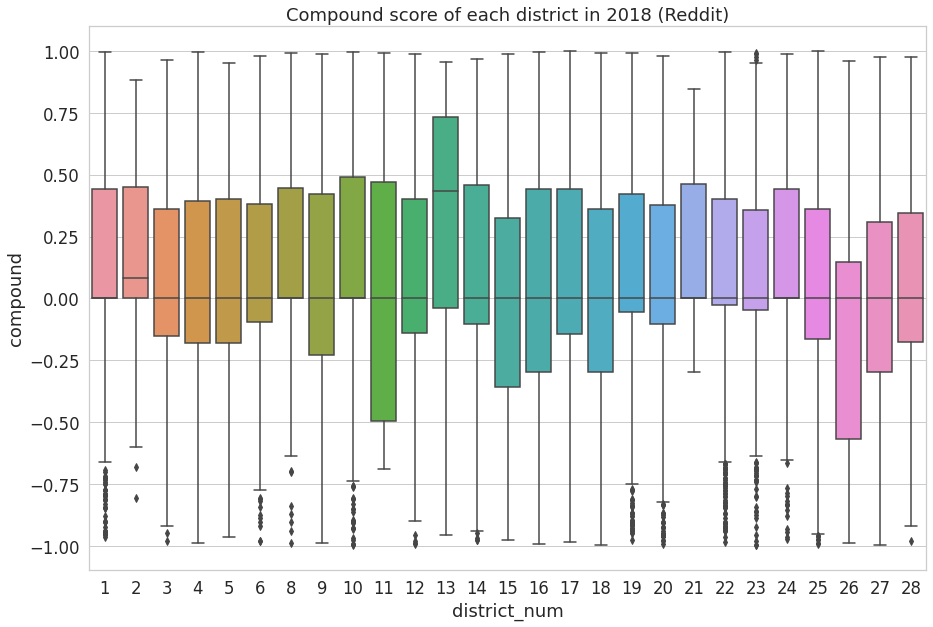

In [15]:
%matplotlib inline

sns.set(rc={'figure.figsize':(15,10)}, font_scale=1.5, style='whitegrid')

sns.boxplot(x="district_num", y="compound", data=year_2018).set_title('Compound score of each district in 2018 (Reddit)');

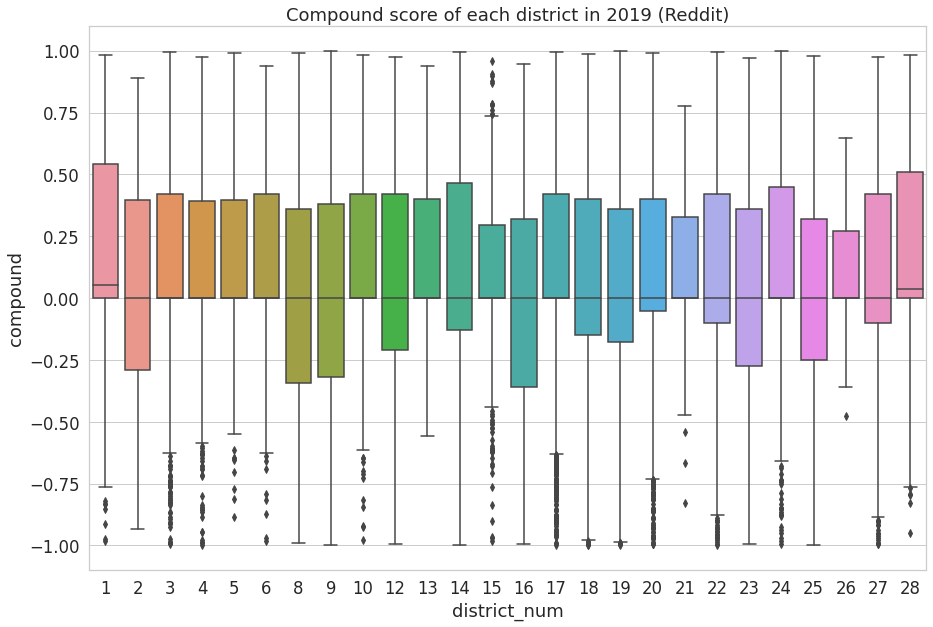

In [16]:
sns.set(rc={'figure.figsize':(15,10)}, font_scale=1.5, style='whitegrid')

sns.boxplot(x="district_num", y="compound", data=year_2019).set_title('Compound score of each district in 2019 (Reddit)');

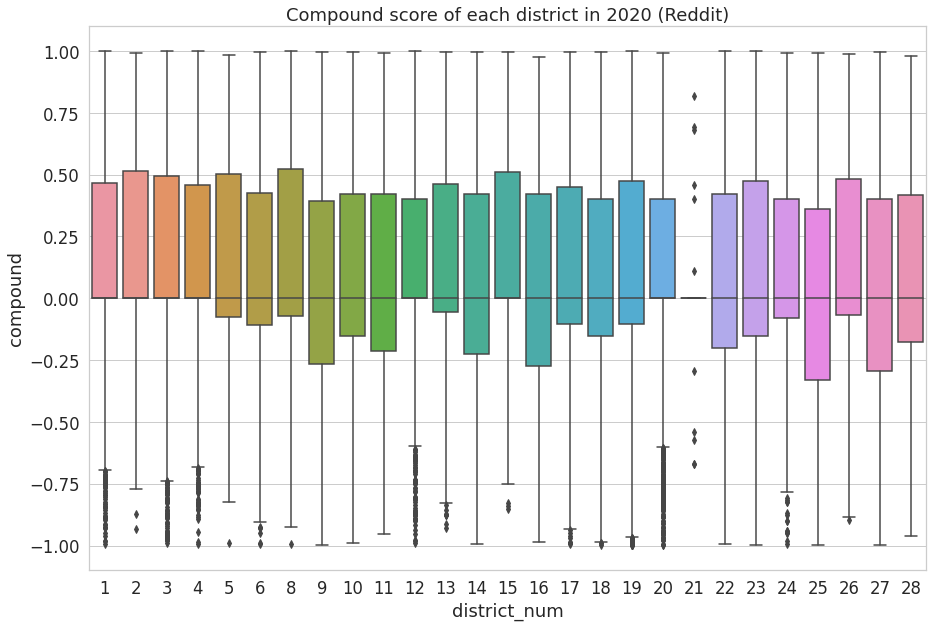

In [17]:
sns.set(rc={'figure.figsize':(15,10)}, font_scale=1.5, style='whitegrid')

sns.boxplot(x="district_num", y="compound", data=year_2020).set_title('Compound score of each district in 2020 (Reddit)');

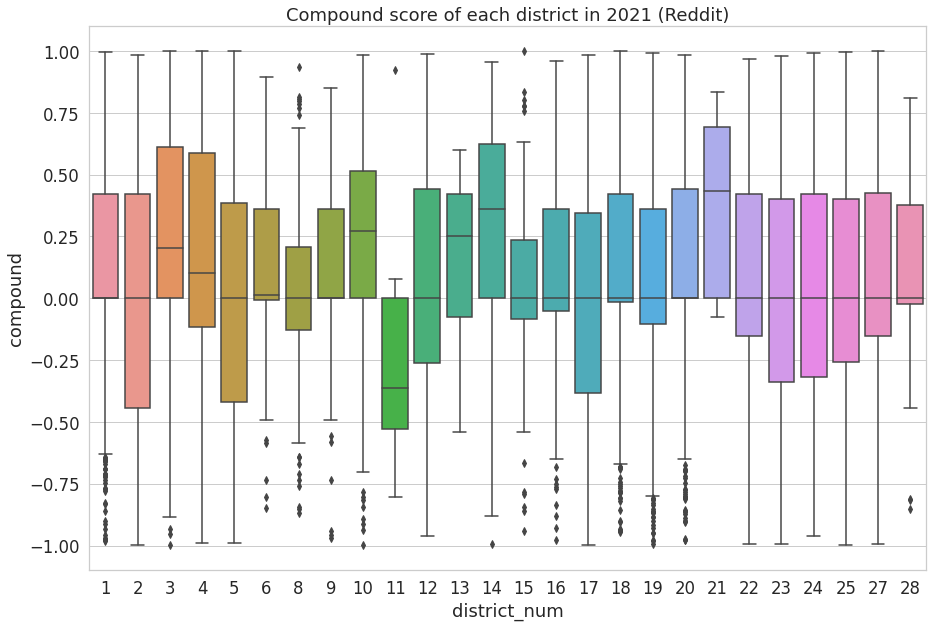

In [18]:
sns.set(rc={'figure.figsize':(15,10)}, font_scale=1.5, style='whitegrid')

sns.boxplot(x="district_num", y="compound", data=year_2021).set_title('Compound score of each district in 2021 (Reddit)');

Grouping and finding the mean sentiment score by district number

In [ ]:
#2018
comment_count_2018 = year_2018.groupby('district_num')['comment_id'].nunique().sort_values(ascending=False)
comment_count_2018  = pd.DataFrame(comment_count_2018)
mean_district_sentiment_2018 = year_2018.groupby('district_num', as_index=False)['compound'].mean()

sentiment_2018 = mean_district_sentiment_2018.merge(comment_count_2018, on='district_num', how='left')
sentiment_2018.columns = ['district_num', 'compound_sentiment', 'comment_count']
sentiment_2018['year'] = 2018

In [ ]:
#2019
comment_count_2019 = year_2019.groupby('district_num')['comment_id'].nunique().sort_values(ascending=False)
comment_count_2019  = pd.DataFrame(comment_count_2019)
mean_district_sentiment_2019 = year_2019.groupby('district_num', as_index=False)['compound'].mean()

sentiment_2019 = mean_district_sentiment_2019.merge(comment_count_2019, on='district_num', how='left')
sentiment_2019.columns = ['district_num', 'compound_sentiment', 'comment_count']
sentiment_2019['year'] = 2019

In [ ]:
#2020
comment_count_2020 = year_2020.groupby('district_num')['comment_id'].nunique().sort_values(ascending=False)
comment_count_2020 = pd.DataFrame(comment_count_2020)
mean_district_sentiment_2020 = year_2020.groupby('district_num', as_index=False)['compound'].mean()

sentiment_2020 = mean_district_sentiment_2020.merge(comment_count_2020, on='district_num', how='left')
sentiment_2020.columns = ['district_num', 'compound_sentiment', 'comment_count']
sentiment_2020['year'] = 2020

In [ ]:
#2021
comment_count_2021 = year_2021.groupby('district_num')['comment_id'].nunique().sort_values(ascending=False)
comment_count_2021 = pd.DataFrame(comment_count_2021)
mean_district_sentiment_2021 = year_2021.groupby('district_num', as_index=False)['compound'].mean()

sentiment_2021 = mean_district_sentiment_2021.merge(comment_count_2021, on='district_num', how='left')
sentiment_2021.columns = ['district_num', 'compound_sentiment', 'comment_count']
sentiment_2021['year'] = 2021


In [ ]:
sentiment_list = [sentiment_2018, sentiment_2019, sentiment_2020, sentiment_2021]  # List of your dataframes
reddit_vader_sentiment = pd.concat(sentiment_list)

In [ ]:
trends_3_district = reddit_vader_sentiment.loc[reddit_vader_sentiment['district_num'].isin([3,15,22])]
trends_3_district

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
plt.rcParams["figure.figsize"] = (20,10)
ax.set_ylim(-1,1)

for i in trends_3_district.district_num.unique():
    trends_3_district[trends_3_district['district_num']==i].plot.line(x='year', y='sentiment', ax=ax, label='id = %s'%i)
plt.xticks(np.unique(trends_3_district.year),rotation=45)    
print("")

fig, ax = plt.subplots(figsize=(20, 10))
plt.rcParams["figure.figsize"] = (20,10)
ax.set_ylim(-1,1)
for i in reddit_sentiment.district_num.unique():
    reddit_sentiment[reddit_sentiment['district_num']==i].plot.line(x='year', y='sentiment', ax=ax, label='id = %s'%i)
plt.xticks(np.unique(reddit_sentiment.year),rotation=45)    
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
print("")

In [ ]:
reddit_vader_sentiment.to_csv("reddit_vader_sentiment.csv", encoding='utf-8', index=False)

Generating WordCloud

Removing Stopwords, words containing number, words with one letter, empty tokens and lematization of text

In [19]:
# return the wordnet object value corresponding to the POS tag
import nltk
import string
from nltk.corpus import wordnet
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.tokenize import WhitespaceTokenizer
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('stopwords')

def get_wordnet_pos(pos_tag):
    if pos_tag.startswith('J'):
        return wordnet.ADJ
    elif pos_tag.startswith('V'):
        return wordnet.VERB
    elif pos_tag.startswith('N'):
        return wordnet.NOUN
    elif pos_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN
    
def clean_text(text):
    # lower text
    text = text.lower()

    # tokenize text and remove puncutation
    text = [word.strip(string.punctuation) for word in text.split(" ")]

    # remove words that contain numbers
    text = [word for word in text if not any(c.isdigit() for c in word)]

    # remove stop words
    stop = set(nltk.corpus.stopwords.words('english'))
    text = [x for x in text if x not in stop]
    # exclude_words = set(('no', 'don', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't",
    #                       'hasn', "hasn't", 'isn', "isn't",'mightn',"mightn't",'mustn',"mustn't",'needn',"needn't",'shan',"shan't",'shouldn',"shouldn't",
    #                      "don't", 'not', "doesn't", 'haven', "haven't", "mightn't","needn't",'wouldn','wasn', "wasn't",'weren',"weren't",' won', "won't", 'wouldn',"wouldn't"))
    # new_stop_words = stop.difference(exclude_words)
    # text = [x for x in text if x not in new_stop_words]

    # remove empty tokens
    text = [t for t in text if len(t) > 0]

    # pos tag text
    pos_tags = pos_tag(text)

    # lemmatize text
    text = [WordNetLemmatizer().lemmatize(t[0], get_wordnet_pos(t[1])) for t in pos_tags]

    # remove words with only one letter
    text = [t for t in text if len(t) > 1]
    # join all
    text = " ".join(text)
    return(text)
    
# clean text data
all_comments_relevant["comment_body"] = all_comments_relevant["comment_body"].apply(lambda x: clean_text(x))

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


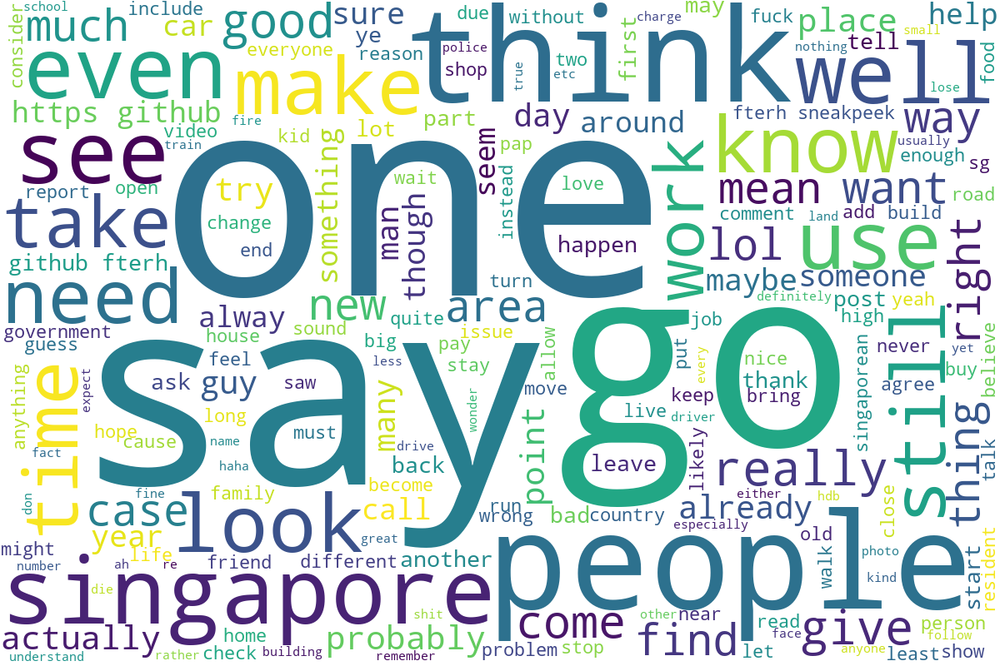

In [ ]:
# Import the wordcloud library
from wordcloud import WordCloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Join the different processed titles together.
long_string = ','.join(list(all_comments_relevant["comment_body"].values))

# Create a WordCloud object with top 200 words
wordcloud = WordCloud(background_color="white", stopwords = STOPWORDS, width=1200, height=800, max_words=200, contour_width=3, contour_color='steelblue')

# Generate a word cloud
wordcloud.generate(long_string)
wordcloud.to_image()

In [ ]:
investigate = all_comments_relevant[all_comments_relevant["comment_body"].str.contains("one")]

print(investigate['comment_body'])

In [ ]:
unique_word_count = all_comments_relevant["comment_body"].str.lower().str.split().values.tolist()

In [ ]:
unique_word_count = [item for sublist in unique_word_count for item in sublist]

In [ ]:
from collections import Counter
counts = Counter(unique_word_count)
word_count_df = pd.DataFrame.from_records(list(dict(counts).items()), columns=['word','count'])
pd.set_option('display.max_rows', word_count_df.shape[0]+1)
word_count_df.sort_values(by=['count'], ascending=False)

,word,count
37,like,8482
31,get,8093
690,people,7487
112,one,7140
8,go,6993
534,say,6850
137,think,5643
33,also,5262
48,would,5168
174,see,5078


Removing irrelevant high frequency words

"code](https://github.com/fterh/sneakpeek" =	586

"contribute](https://github.com/fterh/sneakpeek" = 586


In [20]:
irrelevant = ['code](https://github.com/fterh/sneakpeek', 'contribute](https://github.com/fterh/sneakpeek', 'code', 'github']

In [21]:
def remove_irrelevant(text):
    # lower text
    text = text.lower()
    
    # tokenize text and remove puncutation
    text = [word.strip(string.punctuation) for word in text.split(" ")]

    # remove irrelevant words
    text = [x for x in text if x not in irrelevant]

    # remove empty tokens
    text = [t for t in text if len(t) > 0]
    
    # pos tag text
    pos_tags = pos_tag(text)

    # lemmatize text
    text = [WordNetLemmatizer().lemmatize(t[0], get_wordnet_pos(t[1])) for t in pos_tags]
    # remove words with only one letter
    text = [t for t in text if len(t) > 1]
    # join all
    text = " ".join(text)
    return(text)
# remove irrelevant text data
all_comments_relevant["comment_body"] = all_comments_relevant["comment_body"].apply(lambda x: remove_irrelevant(x))

In [ ]:
all_comments_relevant['comment_body'].replace('', np.nan, inplace=True)
all_comments_relevant.dropna(subset=['comment_body'], inplace=True)

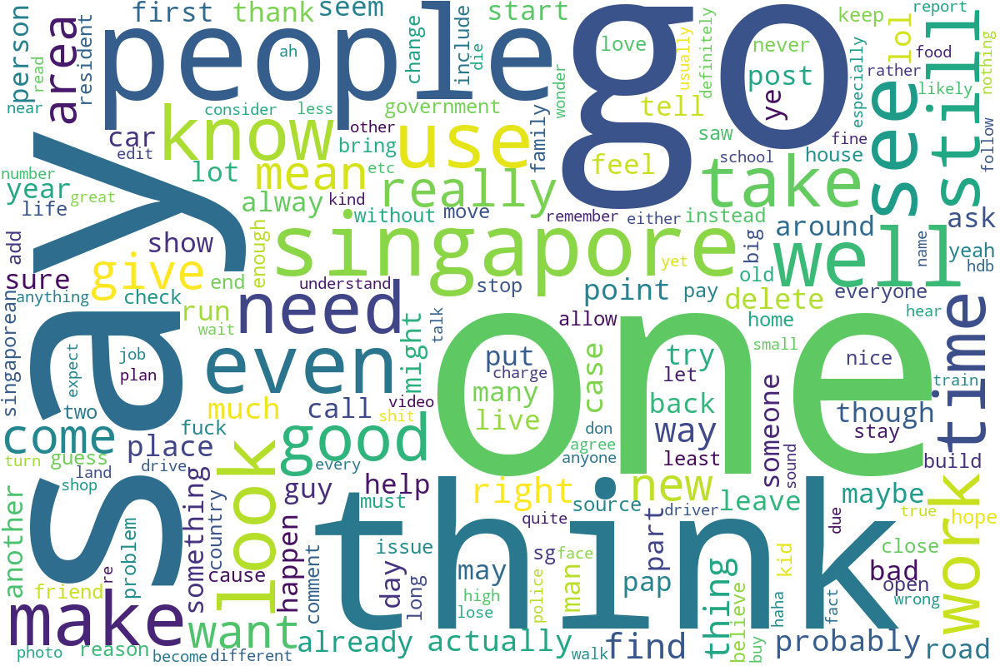

In [ ]:
# Import the wordcloud library
from wordcloud import WordCloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Join the different processed titles together.
long_string = ','.join(list(all_comments_relevant["comment_body"].values))

# Create a WordCloud object with top 200 words
wordcloud = WordCloud(background_color="white", width=1200, height=800, max_words=200, contour_width=3, contour_color='steelblue')

# Generate a word cloud
wordcloud.generate(long_string)
wordcloud.to_image()

In [22]:
#From the boxplot, district 11 has median score of below 0 in 2021. Thus, lets plot a word cloud to inspect.

relevant_2021 = all_comments_relevant[all_comments_relevant['created'].str.contains("2021")] 
district_11_2021 = relevant_2021[relevant_2021['district_num']== 11] 

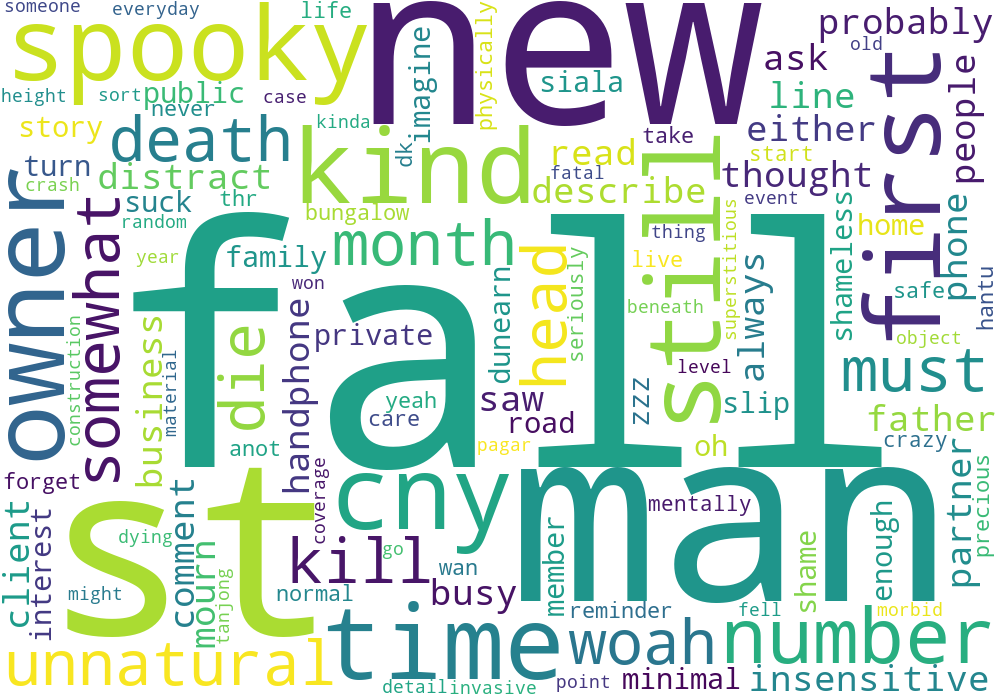

In [23]:
# Import the wordcloud library
from wordcloud import WordCloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Join the different processed titles together.
long_string = ','.join(list(district_11_2021["comment_body"].values))

# Create a WordCloud object
wordcloud = WordCloud(background_color="white", stopwords = STOPWORDS, width=1000, height=700, max_words=200, contour_width=3, contour_color='steelblue')

# Generate a word cloud
wordcloud.generate(long_string)

wordcloud.to_image()

In [25]:
import collections
filtered_words = [word for word in long_string.split() if word not in STOPWORDS]
counted_words = collections.Counter(filtered_words)

words = []
counts = []
for letter, count in counted_words.most_common(10):
    words.append(letter)
    counts.append(count)

<BarContainer object of 10 artists>

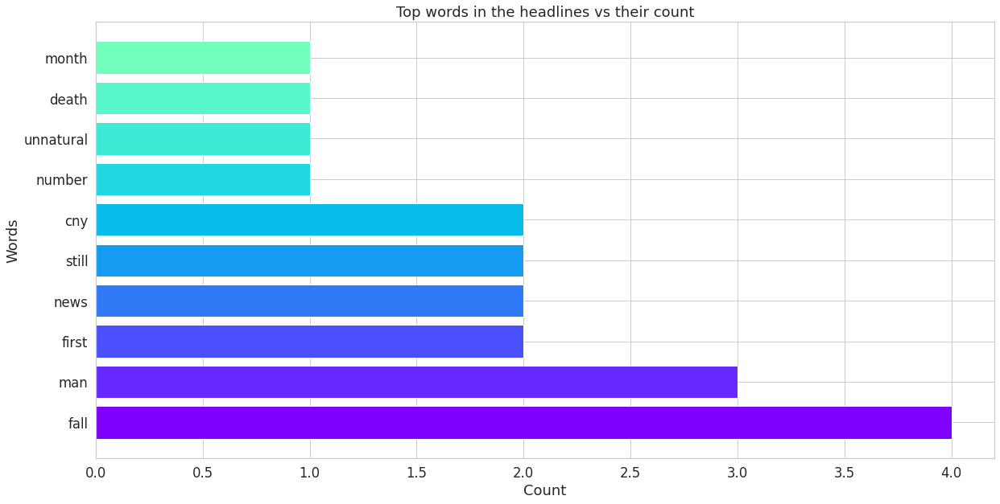

In [26]:
import matplotlib.cm as cm
from matplotlib import rcParams

colors = cm.rainbow(np.linspace(0, 1, 20))
rcParams['figure.figsize'] = 20, 10

plt.title('Top words in the headlines vs their count')
plt.xlabel('Count')
plt.ylabel('Words')
plt.barh(words, counts, color=colors)

In [27]:
sid = SentimentIntensityAnalyzer()
sentiment_top10 = []
for w in words:
  sentiment =  sid.polarity_scores(w)
  print(w , "= Sentiment Polarity Score of:", sentiment)

fall = Sentiment Polarity Score of: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
man = Sentiment Polarity Score of: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
first = Sentiment Polarity Score of: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
news = Sentiment Polarity Score of: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
still = Sentiment Polarity Score of: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
cny = Sentiment Polarity Score of: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
number = Sentiment Polarity Score of: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.0772}
unnatural = Sentiment Polarity Score of: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
death = Sentiment Polarity Score of: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.5994}
month = Sentiment Polarity Score of: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}


LDA wth Gensim for Topic Modelling

Text Cleaning for LDA

In [28]:
import gensim
from gensim.utils import simple_preprocess
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

def sent_to_words(sentences):
    for sentence in sentences:
        # deacc=True removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) 
             if word not in stop_words] for doc in texts]

data = all_comments_relevant["comment_body"].values.tolist()
data_words = list(sent_to_words(data))
# remove stop words
data_words = remove_stopwords(data_words)
print(data_words[:1][0][:30])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
['imagine', 'make', 'singapore', 'inspire', 'gta', 'map']


Using Gensim corpora to create a unique id for each word in the document

In [29]:
import gensim.corpora as corpora
# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1][0][:30])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1)]


Building Base Model to get a baseline coherence score

In [30]:
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=10, 
                                       random_state=100,
                                       chunksize=100,
                                       passes=10,
                                       per_word_topics=True)

In [31]:
from gensim.models import CoherenceModel
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.37849017799094614


In [40]:
from gensim.models.ldamodel import LdaModel
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=1):

    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model=LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics)
        # model = gensim.models.LdaMulticore(corpus=corpus,
        #                         id2word=dictionary,
        #                         num_topics=num_topics, 
        #                         random_state=100,
        #                         chunksize=100,
        #                         passes=10,
        #                         per_word_topics=True)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

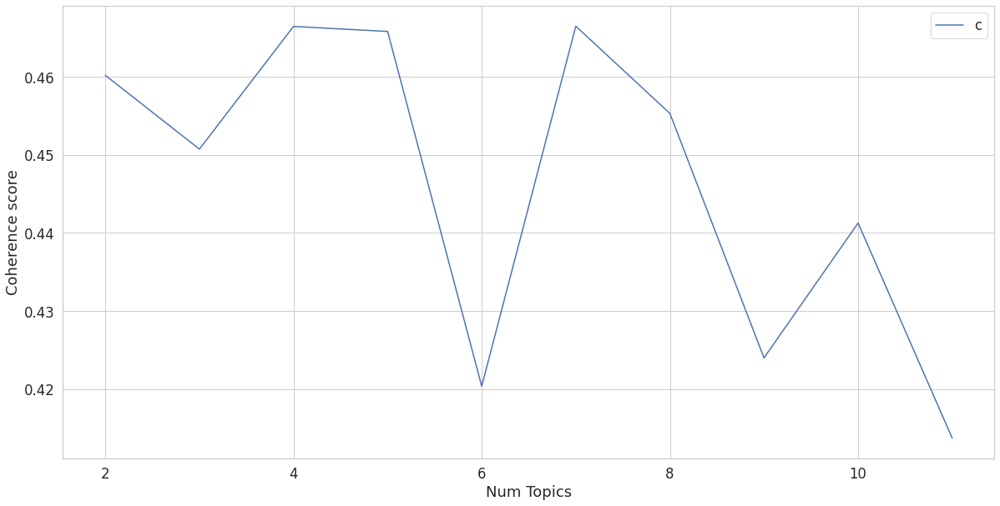

In [41]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words, limit=12, start=2, step=1)

# Show graph
import matplotlib.pyplot as plt
limit=12; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [42]:
# Build Final LDA model
lda_model_final = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=7, 
                                       random_state=100,
                                       chunksize=100,
                                       passes=10,
                                       per_word_topics=True)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

In [43]:
from gensim.models import CoherenceModel
# Compute Coherence Score
coherence_model_lda_final = CoherenceModel(model=lda_model_final, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda_final = coherence_model_lda_final.get_coherence()
print('\nFinal Coherence Score: ', coherence_lda_final)


Final Coherence Score:  0.3991213446016172


Hyperparameter tuning including finding optimum alpha, beta and number of topic (Not used)

In [ ]:
# supporting function
def compute_coherence_values(corpus, dictionary, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [ ]:
import numpy as np
import tqdm
grid = {}
grid['Validation_Set'] = {}
# Topics range
min_topics = 3
max_topics = 10
step_size = 1
topics_range = range(min_topics, max_topics, step_size)
# Alpha parameter
alpha = list(np.arange(0.01, 1, 0.3))
alpha.append('symmetric')
alpha.append('asymmetric')
# Beta parameter
beta = list(np.arange(0.01, 1, 0.3))
beta.append('symmetric')
# Validation sets
num_of_docs = len(corpus)
corpus_sets = [# gensim.utils.ClippedCorpus(corpus, num_of_docs*0.25), 
               # gensim.utils.ClippedCorpus(corpus, num_of_docs*0.5), 
               gensim.utils.ClippedCorpus(corpus, int(num_of_docs*0.75)), 
               corpus]
corpus_title = ['75% Corpus', '100% Corpus']
model_results = {'Validation_Set': [],
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }
# Can take a long time to run
if 1 == 1:
    pbar = tqdm.tqdm(total=540)
    
    # iterate through validation corpuses
    for i in range(len(corpus_sets)):
        # iterate through number of topics
        for k in topics_range:
            # iterate through alpha values
            for a in alpha:
                # iterare through beta values
                for b in beta:
                    # get the coherence score for the given parameters
                    cv = compute_coherence_values(corpus=corpus_sets[i], dictionary=id2word, 
                                                  k=k, a=a, b=b)
                    # Save the model results
                    model_results['Validation_Set'].append(corpus_title[i])
                    model_results['Topics'].append(k)
                    model_results['Alpha'].append(a)
                    model_results['Beta'].append(b)
                    model_results['Coherence'].append(cv)
                    
                    pbar.update(1)
    pd.DataFrame(model_results).to_csv('lda_tuning_results.csv', index=False)
    pbar.close()

 78%|█████████████████████████████████████████████████████████▌                | 420/540 [15:02:27<4:17:50, 128.92s/it]


In [ ]:
pd.DataFrame(model_results).to_csv('lda_tuning_results_reddit.csv', index=False)

Analyzing LDA model results

In [ ]:
!pip install pyLDAvis

In [39]:
# Visualize the topics
import pickle 
import pyLDAvis
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model_final, corpus, id2word)
vis

PreparedData(topic_coordinates=              x    y  topics  cluster       Freq
topic                                           
1      0.194294  0.0       1        1  58.138484
0     -0.194294  0.0       2        1  41.861516, topic_info=          Term         Freq        Total Category  logprob  loglift
31        like  9698.000000  9698.000000  Default  30.0000  30.0000
648     people  8407.000000  8407.000000  Default  29.0000  29.0000
29         get  8307.000000  8307.000000  Default  28.0000  28.0000
5    singapore  6859.000000  6859.000000  Default  27.0000  27.0000
137      think  5445.000000  5445.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
113        one  2454.946503  7714.223308   Topic2  -5.2734  -0.2742
296        day  1643.090970  3467.880806   Topic2  -5.6749   0.1238
154       time  1924.044955  5462.405147   Topic2  -5.5171  -0.1727
94        take  1468.349140  4741.046088   Topic2  -5.7873  -0.3013
188       find  1217.745165  2571.003262   Topic2  -5.9745   0.1235

[136 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
139       1  0.999598       actually
139       2  0.000517       actually
397       1  0.001476            add
397       2  0.998624            add
4311      1  0.001320  advertisement
...     ...       ...            ...
2532      2  0.999621            www
169       1  0.282630           year
169       2  0.717317           year
430       1  0.999573            yes
430       2  0.000585            yes

[202 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1])

Convert cleaned comments to csv

In [ ]:
all_comments_relevant.to_csv('all_comments_relevant_reddit.csv',index = False)

Load csv file with all the comments for sentiment analysis

In [ ]:
all_comments_relevant = pd.read_csv('/content/drive/MyDrive/BT4222 WEISHENG/Generated csv/reddit/all_comments_relevant_reddit.csv')

In [ ]:
#Getting comments from 2018 to 2021
year_2018 = all_comments_relevant[all_comments_relevant['created'].str.contains("2018")] 
year_2019 = all_comments_relevant[all_comments_relevant['created'].str.contains("2019")] 
year_2020 = all_comments_relevant[all_comments_relevant['created'].str.contains("2020")] 
year_2021 = all_comments_relevant[all_comments_relevant['created'].str.contains("2021")]

Year 2018


In [ ]:
year_2018.head()

,district_num,comment_id,comment_parent_id,comment_body,comment_link_id,created
115,3,e0ghpaw,t3_8q4nif,much put map can't even find,t3_8q4nif,10-06-2018
116,3,e0gjsqr,t3_8q4nif,long since british leave,t3_8q4nif,11-06-2018
117,3,e0gjusx,t3_8q4nif,tbf there's actually shangri-la's rasa sentosa...,t3_8q4nif,11-06-2018
118,3,e0ghzi1,t3_8q4nif,wonder manage plot hotel island though,t3_8q4nif,10-06-2018
119,3,e0gmv44,t3_8q4nif,lol bridge connect tiny island china,t3_8q4nif,11-06-2018


Sentiment analysis using TextBlob

In [ ]:
from textblob import TextBlob

# define a function that accepts text and returns the polarity
def detect_sentiment(text):
        
    # use this line instead for Python 3
    blob = TextBlob(text)
    
    # return the polarity
    return blob.sentiment.polarity

In [ ]:
year_2018['sentiment'] = year_2018.comment_body.apply(detect_sentiment)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
# highest positive sentiment reviews
highest_positive_2018 = year_2018.sort_values(by=['sentiment'], ascending=False)
highest_positive_2018.head(10)

,district_num,comment_id,comment_parent_id,comment_body,comment_link_id,created,sentiment
64100,16,e43ykuc,t1_e43s4fs,west side best side,t3_96wupi,13-08-2018,1.0
6953,27,e2ba2x4,t1_e2b25pv,yishun send people send best,t3_8yi3c5,13-07-2018,1.0
35562,24,e7ds80q,t3_9mcjq8,joey lu follow work absolutely breathtaking,t3_9mcjq8,08-10-2018,1.0
48540,18,dyj4dy8,t3_8hea39,east side best side,t3_8hea39,06-05-2018,1.0
31446,17,dto72eg,t1_dtnq295,man thats awesome time change,t3_7urhet,03-02-2018,1.0
67308,14,e0kpmd6,t1_e0kmpos,yeah everyone know changi business park world'...,t3_8qigd3,13-06-2018,1.0
57880,22,dyon9p8,t3_8i32l0,best station name peng kang hill,t3_8i32l0,09-05-2018,1.0
48547,18,dyj63g8,t1_dyj4dy8,two side singapore west side best side,t3_8hea39,06-05-2018,1.0
32630,17,eamjbt2,t1_eak4pla,work space kinect actually best sensor market ...,t3_a0ns58,28-11-2018,1.0
52849,22,e5skc0q,t3_9eyz8n,cannot beat thai doctor lah still best,t3_9eyz8n,11-09-2018,1.0


In [ ]:
# highest lowest sentiment reviews
lowest_positive_2018 = year_2018.sort_values(by=['sentiment'], ascending=True)
lowest_positive_2018.head(10)

,district_num,comment_id,comment_parent_id,comment_body,comment_link_id,created,sentiment
47452,18,e1rfkqq,t3_8vyb2m,terrible news,t3_8vyb2m,04-07-2018,-1.0
50258,23,e3rueaz,t3_95d7gn,absolutely insane wind lim chu kang well,t3_95d7gn,07-08-2018,-1.0
49215,18,e433an8,t1_e424ftr,horrible man eat child ito junji uzumaki make ...,t3_96oq3t,12-08-2018,-1.0
67703,14,dt3at05,t3_7s5evu,dude punggol much worst,t3_7s5evu,23-01-2018,-1.0
48275,18,ebrce74,t1_ebr5r18,call chaotic evil aka joker auntie want see wo...,t3_a61vml,14-12-2018,-1.0
31523,17,dttdkd3,t1_dttd0ux,thats plane terrible,t3_7vltpi,06-02-2018,-1.0
21576,19,e88fgrt,t3_9qd27a,insane shot bruh,t3_9qd27a,22-10-2018,-1.0
1924,3,e1tfpx6,t3_8w68dv,food inside insanely price buy food drink vivo...,t3_8w68dv,05-07-2018,-1.0
27996,19,e2ghk93,t3_8z17fp,wholesomeness need dreadful monday morning,t3_8z17fp,16-07-2018,-1.0
53644,22,ebr8mf0,t3_a62jng,that's horrible 😭😭,t3_a62jng,14-12-2018,-1.0


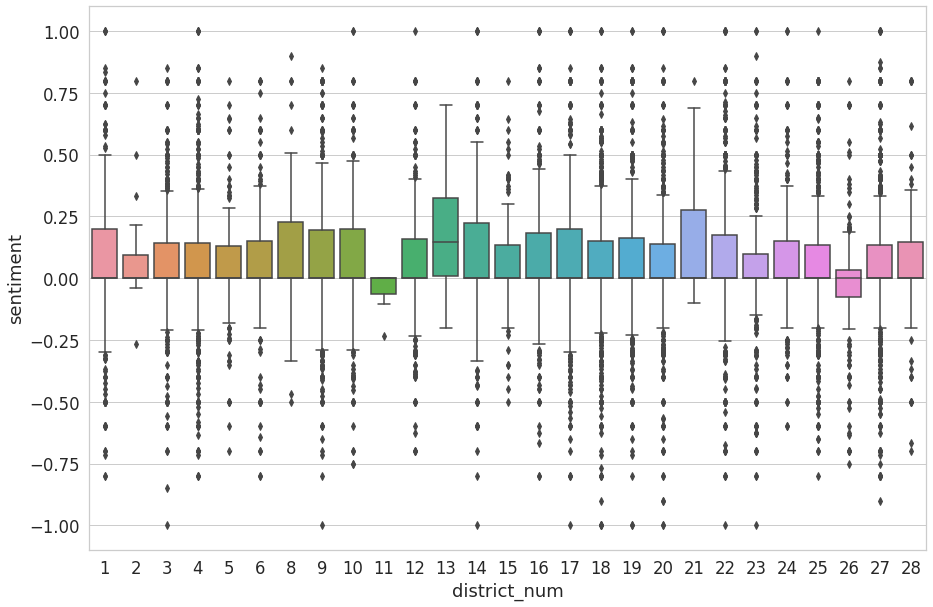

In [ ]:
%matplotlib inline

sns.set(rc={'figure.figsize':(15,10)}, font_scale=1.5, style='whitegrid')

sns.boxplot(x="district_num", y="sentiment", data=year_2018);

Year 2019

In [ ]:
year_2019['sentiment'] = year_2019.comment_body.apply(detect_sentiment)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
# highest positive sentiment reviews
highest_positive_2019 = year_2019.sort_values(by=['sentiment'], ascending=False)
highest_positive_2019.head(10)

,district_num,comment_id,comment_parent_id,comment_body,comment_link_id,created,sentiment
10430,8,eybj25x,t1_eyb4rem,log horizon imo best isekai look reccommendations,t3_cwebdp,28-08-2019,1.0
70377,1,elw4fpw,t3_bhv2c1,look awesome,t3_bhv2c1,27-04-2019,1.0
67777,14,eq4sd92,t3_bx1ar2,awesome teach child entrepreneurship economics...,t3_bx1ar2,06-06-2019,1.0
70795,1,f1z8g9e,t3_db66w8,awesome contrast,t3_db66w8,30-09-2019,1.0
32864,17,esis23o,t1_esig8a4,specifically chose airport rat one best,t3_c7x2jh,01-07-2019,1.0
3699,5,f4ka1yc,t3_dkwk1r,perfect place halloween horror night,t3_dkwk1r,21-10-2019,1.0
7638,27,evp8ueb,t1_eve5dko,deserve best,t3_cjbax9,01-08-2019,1.0
73695,1,exy2saw,t3_cupd7p,one best shot i've see place,t3_cupd7p,24-08-2019,1.0
34299,21,erfx839,t1_erdsa0w,sword fight excellent display swordsman ship,t3_c1hhn1,18-06-2019,1.0
7170,27,elwjqzr,t1_elwgcb7,iphones can't even handle drop ground level le...,t3_bhw3f8,27-04-2019,1.0


There are some sarcasm comments that are given positive sentiment such as "sword fight excellent display swordsman ship"

In [ ]:
# highest lowest sentiment reviews
lowest_positive_2019 = year_2019.sort_values(by=['sentiment'], ascending=True)
lowest_positive_2019.head(10)

,district_num,comment_id,comment_parent_id,comment_body,comment_link_id,created,sentiment
10035,8,eyael6n,t3_cwebdp,omg could’ved die horrible way die,t3_cwebdp,28-08-2019,-1.0
72868,1,esja3aw,t3_c81xyl,dreadful,t3_c81xyl,02-07-2019,-1.0
9390,6,f8y62db,t1_f8xj3j6,point view gahment evil,t3_e2d9l9,28-11-2019,-1.0
32382,17,es2d61h,t1_es02z9g,imagine read story family distress still feel ...,t3_c55hg1,26-06-2019,-1.0
61209,12,f6v5zuc,t1_f6slhwb,fk that’s horrible,t3_dsy9yl,08-11-2019,-1.0
6480,27,ey4rqjo,t3_cvkmfr,hair’s go smell awful,t3_cvkmfr,26-08-2019,-1.0
13691,4,eu45is7,t3_cepuat,taxi driver worst sort driver,t3_cepuat,18-07-2019,-1.0
69054,15,fcjd7kl,t3_ehhcfj,awful day perfectionist,t3_ehhcfj,30-12-2019,-1.0
6973,27,eyvzq9w,t3_cz2wmm,well prove yishunites indeed insane,t3_cz2wmm,03-09-2019,-1.0
59868,12,empf2hs,t3_bldohd,longer shall people toa payoh plague fear evil...,t3_bldohd,07-05-2019,-1.0


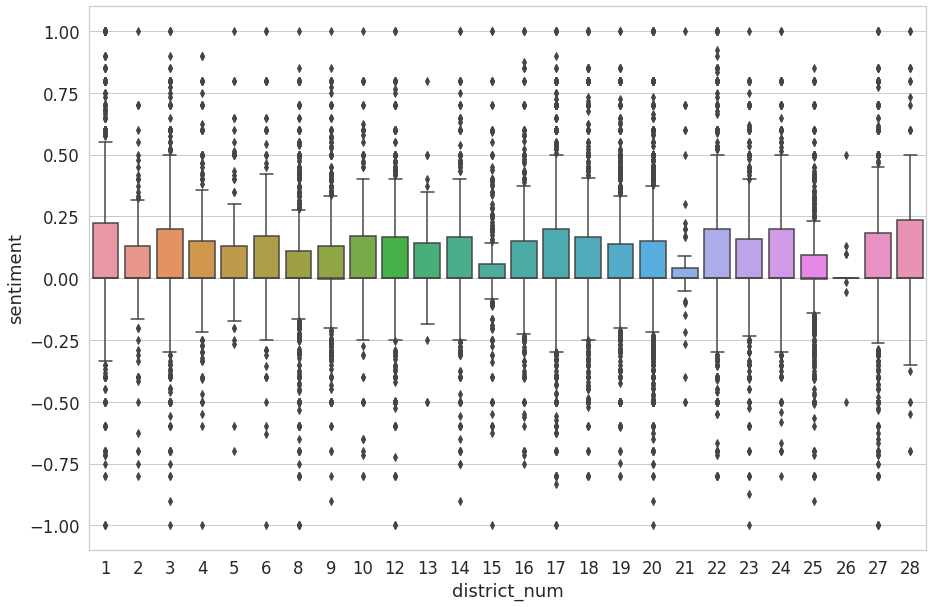

In [ ]:
import seaborn as sns
%matplotlib inline

sns.set(rc={'figure.figsize':(15,10)}, font_scale=1.5, style='whitegrid')

sns.boxplot(x="district_num", y="sentiment", data=year_2019);

Year 2020

In [ ]:
year_2020['sentiment'] = year_2020.comment_body.apply(detect_sentiment)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
# highest positive sentiment reviews
highest_positive_2020 = year_2020.sort_values(by=['sentiment'], ascending=False)
highest_positive_2020.head(10)

,district_num,comment_id,comment_parent_id,comment_body,comment_link_id,created,sentiment
23422,19,fidt31n,t3_f7r3vn,awesome shot 👍🏼,t3_f7r3vn,22-02-2020,1.0
3126,3,fhwhjyk,t3_f52wpw,superb photo moody,t3_f52wpw,17-02-2020,1.0
52752,22,fwbxcf6,t3_hhdoah,excellent heart thank advance contribute count...,t3_hhdoah,29-06-2020,1.0
63394,10,fvg7j8v,t3_hcnvnp,friday night \n\nit happen everyone start leav...,t3_hcnvnp,20-06-2020,1.0
10710,8,fhkb122,t1_fhk180m,confirm best biryani town,t3_f3o8ew,14-02-2020,1.0
10688,8,fhkdsjd,t1_fhk6eov,best comment yet,t3_f3o8ew,14-02-2020,1.0
10671,8,fhkfuxd,t3_f3o8ew,among best country mins wait i'm come,t3_f3o8ew,14-02-2020,1.0
37770,25,fpi4zu5,t3_gdai05,awesome shot,t3_gdai05,04-05-2020,1.0
68277,15,fimq50h,t3_f8pgf8,best korea best civilisation,t3_f8pgf8,24-02-2020,1.0
10523,8,g9ea823,t3_je3l2k,yoooo really wonderful shot,t3_je3l2k,20-10-2020,1.0


In [ ]:
# highest lowest sentiment reviews
lowest_positive_2020 = year_2018.sort_values(by=['sentiment'], ascending=True)
lowest_positive_2020.head(10)

,district_num,comment_id,comment_parent_id,comment_body,comment_link_id,created,sentiment
47452,18,e1rfkqq,t3_8vyb2m,terrible news,t3_8vyb2m,04-07-2018,-1.0
50258,23,e3rueaz,t3_95d7gn,absolutely insane wind lim chu kang well,t3_95d7gn,07-08-2018,-1.0
49215,18,e433an8,t1_e424ftr,horrible man eat child ito junji uzumaki make ...,t3_96oq3t,12-08-2018,-1.0
67703,14,dt3at05,t3_7s5evu,dude punggol much worst,t3_7s5evu,23-01-2018,-1.0
48275,18,ebrce74,t1_ebr5r18,call chaotic evil aka joker auntie want see wo...,t3_a61vml,14-12-2018,-1.0
31523,17,dttdkd3,t1_dttd0ux,thats plane terrible,t3_7vltpi,06-02-2018,-1.0
21576,19,e88fgrt,t3_9qd27a,insane shot bruh,t3_9qd27a,22-10-2018,-1.0
1924,3,e1tfpx6,t3_8w68dv,food inside insanely price buy food drink vivo...,t3_8w68dv,05-07-2018,-1.0
27996,19,e2ghk93,t3_8z17fp,wholesomeness need dreadful monday morning,t3_8z17fp,16-07-2018,-1.0
53644,22,ebr8mf0,t3_a62jng,that's horrible 😭😭,t3_a62jng,14-12-2018,-1.0


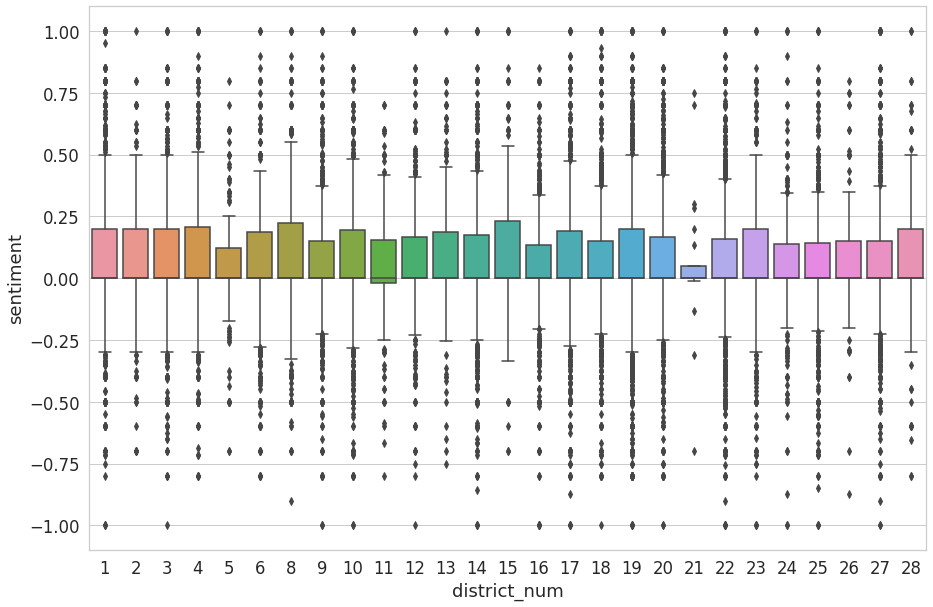

In [ ]:
sns.set(rc={'figure.figsize':(15,10)}, font_scale=1.5, style='whitegrid')
sns.boxplot(x="district_num", y="sentiment", data=year_2020);

Year 2021


In [ ]:
year_2021['sentiment'] = year_2021.comment_body.apply(detect_sentiment)
year_2021.head(3)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,district_num,comment_id,comment_parent_id,comment_body,comment_link_id,created,sentiment
203,3,gqanxx0,t3_m0rlwm,ahh wow family water's edge sunset capture mom...,t3_m0rlwm,09-03-2021,0.55
204,3,gq9p9wo,t3_m0rlwm,film use,t3_m0rlwm,08-03-2021,0.00
205,3,gqahi4g,t3_m0rlwm,camera use i’m beginner look film photography,t3_m0rlwm,09-03-2021,0.00


In [ ]:
# highest positive sentiment reviews
highest_positive_2021 = year_2021.sort_values(by=['sentiment'], ascending=False)
highest_positive_2021.head(10)

,district_num,comment_id,comment_parent_id,comment_body,comment_link_id,created,sentiment
42492,20,glgku5e,t3_l8hdz8,ah yes best music amk town,t3_l8hdz8,31-01-2021,1.0
34570,24,gqkgkta,t1_gqk0yxx,hakuuuuuuuuuuuuuna matata~\n\nwhat wonderful p...,t3_m2mm5t,11-03-2021,1.0
66466,14,giddxer,t3_krqo3j,awesome pic,t3_krqo3j,07-01-2021,1.0
40649,20,ghosh1t,t3_ko1xbd,that's awesome,t3_ko1xbd,01-01-2021,1.0
73931,1,gmklsw1,t3_lf8778,best,t3_lf8778,08-02-2021,1.0
54488,22,gqep7pu,t3_m1nh81,awesome 🙏🙏,t3_m1nh81,10-03-2021,1.0
35308,24,gnvpa0h,t1_gnvms79,impressed list provide also via comparison use...,t3_lmkpec,18-02-2021,1.0
66303,14,gqjahn9,t3_m2fmxo,music shot awesome dope work,t3_m2fmxo,11-03-2021,1.0
13442,4,glvfm87,t3_lbgam8,use bakery photographer stand photo sell delic...,t3_lbgam8,03-02-2021,1.0
990,3,gkop5zp,t3_l4fjbv,south seem best view sunset,t3_l4fjbv,25-01-2021,1.0


In [ ]:
# highest lowest sentiment reviews
lowest_positive_2021 = year_2021.sort_values(by=['sentiment'], ascending=True)
lowest_positive_2021.head(10)

,district_num,comment_id,comment_parent_id,comment_body,comment_link_id,created,sentiment
41705,20,gott8x7,t3_lsxv1e,damn awful way go,t3_lsxv1e,26-02-2021,-1.0
66456,14,gibsry6,t3_krqo3j,wanna see video colour insane dude,t3_krqo3j,06-01-2021,-1.0
32140,17,gjul3mm,t1_gjugpfw,cgh terrible reputation amongst paramedic well,t3_l0l7pm,19-01-2021,-1.0
19421,2,gn6xvf1,t3_lixos8,one terribly write article world author drive ...,t3_lixos8,13-02-2021,-1.0
29722,17,gkgm449,t1_gkew6al,terrible,t3_l3b2g0,23-01-2021,-1.0
3536,5,gozpx4x,t3_ltm76q,damn stuff nightmare horrible way go rip,t3_ltm76q,27-02-2021,-1.0
40516,20,gjorbfi,t1_gjo4ll7,day worm receive cruel reminder,t3_kzik1t,18-01-2021,-1.0
6302,27,gm3z66s,t3_ld5zcm,terrible shame rip condolence friends family,t3_ld5zcm,05-02-2021,-1.0
18929,2,gno7jhw,t1_gnnsuhr,thats horrible,t3_ll3zj2,16-02-2021,-1.0
42506,20,gld51ue,t1_glcvs3f,busk ah peks sing boring song though,t3_l8hdz8,30-01-2021,-1.0


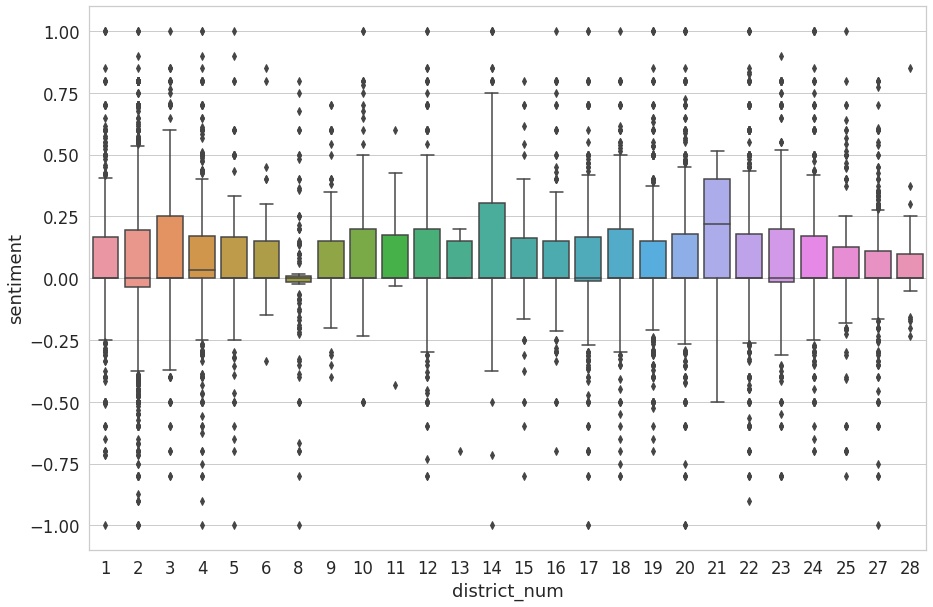

In [ ]:
sns.set(rc={'figure.figsize':(15,10)}, font_scale=1.5, style='whitegrid')
sns.boxplot(x="district_num", y="sentiment", data=year_2021);

Grouping and finding the mean sentiment score by district number

In [ ]:
#2018
comment_count_2018 = year_2018.groupby('district_num')['comment_id'].nunique().sort_values(ascending=False)
comment_count_2018  = pd.DataFrame(comment_count_2018)
mean_district_sentiment_2018 = year_2018.groupby('district_num', as_index=False)['sentiment'].mean()

sentiment_2018 = mean_district_sentiment_2018.merge(comment_count_2018, on='district_num', how='left')
sentiment_2018.columns = ['district_num', 'sentiment', 'comment_count']
sentiment_2018['year'] = 2018

In [ ]:
#2019
comment_count_2019 = year_2019.groupby('district_num')['comment_id'].nunique().sort_values(ascending=False)
comment_count_2019  = pd.DataFrame(comment_count_2019)
mean_district_sentiment_2019 = year_2019.groupby('district_num', as_index=False)['sentiment'].mean()

sentiment_2019 = mean_district_sentiment_2019.merge(comment_count_2019, on='district_num', how='left')
sentiment_2019.columns = ['district_num', 'sentiment', 'comment_count']
sentiment_2019['year'] = 2019

In [ ]:
#2020
comment_count_2020 = year_2020.groupby('district_num')['comment_id'].nunique().sort_values(ascending=False)
comment_count_2020 = pd.DataFrame(comment_count_2020)
mean_district_sentiment_2020 = year_2020.groupby('district_num', as_index=False)['sentiment'].mean()

sentiment_2020 = mean_district_sentiment_2020.merge(comment_count_2020, on='district_num', how='left')
sentiment_2020.columns = ['district_num', 'sentiment', 'comment_count']
sentiment_2020['year'] = 2020

In [ ]:
#2021
comment_count_2021 = year_2021.groupby('district_num')['comment_id'].nunique().sort_values(ascending=False)
comment_count_2021 = pd.DataFrame(comment_count_2021)
mean_district_sentiment_2021 = year_2021.groupby('district_num', as_index=False)['sentiment'].mean()

sentiment_2021 = mean_district_sentiment_2021.merge(comment_count_2021, on='district_num', how='left')
sentiment_2021.columns = ['district_num', 'sentiment', 'comment_count']
sentiment_2021['year'] = 2021

In [ ]:
sentiment_list = [sentiment_2018, sentiment_2019, sentiment_2020, sentiment_2021]  # List of your dataframes
reddit_sentiment = pd.concat(sentiment_list)

In [ ]:
reddit_sentiment

,district_num,sentiment,comment_count,year
0,1,0.079938,676,2018
1,2,0.087518,23,2018
2,3,0.055071,571,2018
3,4,0.051841,813,2018
4,5,0.046327,196,2018
...,...,...,...,...
21,23,0.074136,482,2021
22,24,0.077776,642,2021
23,25,0.043112,239,2021
24,27,0.031414,319,2021


In [ ]:
trends_3_district = reddit_sentiment.loc[reddit_sentiment['district_num'].isin([3,15,22])]
trends_3_district

,district_num,sentiment,comment_count,year
2,3,0.055071,571,2018
13,15,0.063583,125,2018
20,22,0.074747,1076,2018
2,3,0.084408,913,2019
12,15,0.039470,281,2019
19,22,0.084081,1335,2019
2,3,0.085211,1612,2020
13,15,0.121767,316,2020
20,22,0.056494,3104,2020
2,3,0.113866,403,2021


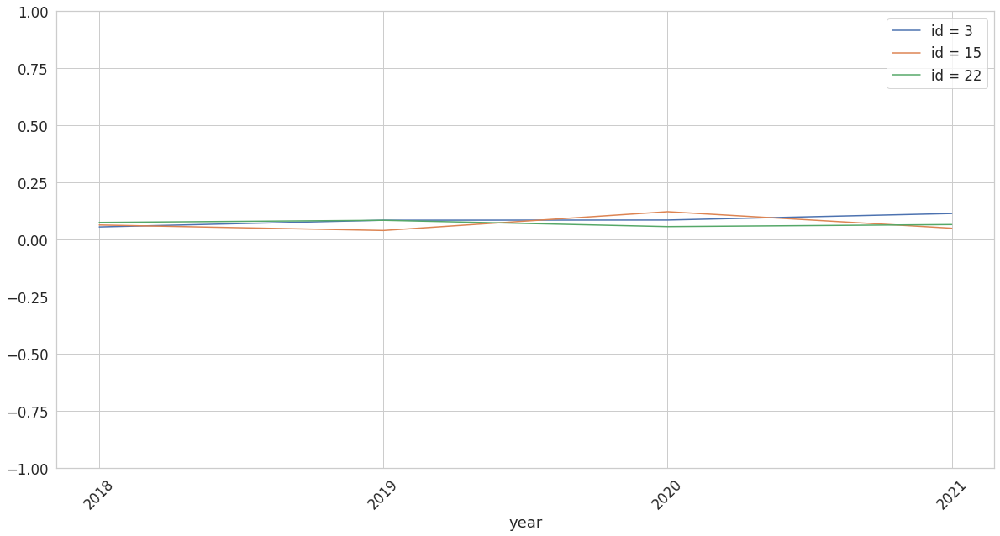

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
plt.rcParams["figure.figsize"] = (20,10)
ax.set_ylim(-1,1)

for i in trends_3_district.district_num.unique():
    trends_3_district[trends_3_district['district_num']==i].plot.line(x='year', y='sentiment', ax=ax, label='id = %s'%i)
plt.xticks(np.unique(trends_3_district.year),rotation=45)    
print("")

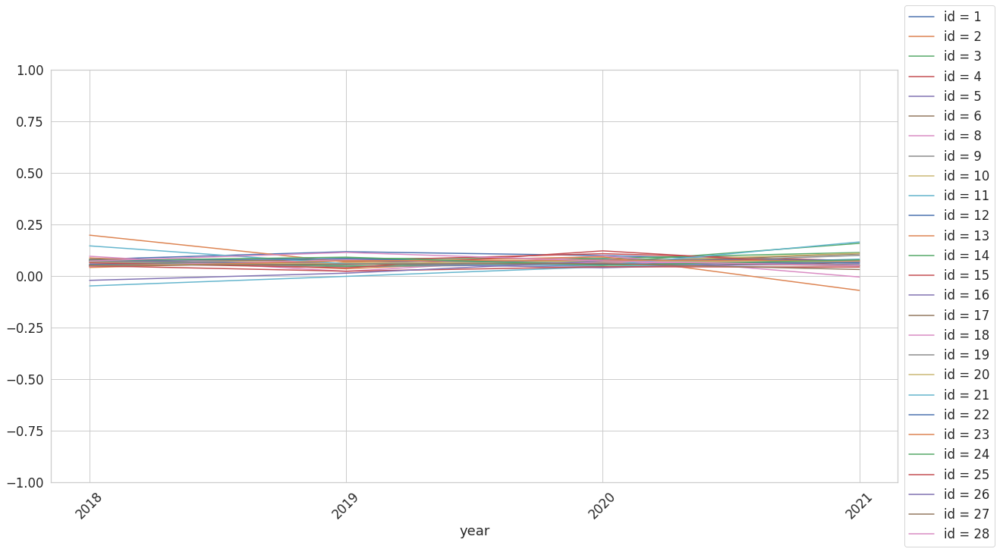

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
plt.rcParams["figure.figsize"] = (20,10)
ax.set_ylim(-1,1)
for i in reddit_sentiment.district_num.unique():
    reddit_sentiment[reddit_sentiment['district_num']==i].plot.line(x='year', y='sentiment', ax=ax, label='id = %s'%i)
plt.xticks(np.unique(reddit_sentiment.year),rotation=45)    
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
print("")

In [ ]:
reddit_sentiment.to_csv("reddit_sentiment.csv", encoding='utf-8', index=False)